# 📘 Employee Attrition - Feature Engineering

---

## 📄 Description  
This notebook performs a **Feature Engineering** which identifies and handles outliers in the dataset.  

## 👨‍💻 Author  
**Kfir Tayar** 

© Copyright 2025, Kfir Tayar. All rights reserved.  

## 🔹 Notebook Overview  
- Check for missing values  
- Plot Boxplot to detect outliers  
- Replace outliers values with NaN  
- Plot Heatmap of the outliers  
- Replace NaN's using MICE Imputer  
- Save the imputed file as a Pickle file

In [46]:
# Import Libraries & Modules
import sys
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Add the path to the utils directory
sys.path.append(os.path.abspath('../utils'))

from data_prep_utils import save_file_as_pickle

### Load Data Set

In [8]:
imputed_df = pd.read_pickle("../Data/imputed_employee_data_20250318.pkl")

In [9]:
imputed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74498 entries, 0 to 74497
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Gender                    74498 non-null  category
 1   Years at Company          74498 non-null  float64 
 2   Job Role                  74498 non-null  category
 3   Monthly Income            74498 non-null  float64 
 4   Work-Life Balance         74498 non-null  category
 5   Job Satisfaction          74498 non-null  category
 6   Performance Rating        74498 non-null  category
 7   Number of Promotions      74498 non-null  category
 8   Overtime                  74498 non-null  category
 9   Distance from Home        74498 non-null  float64 
 10  Education Level           74498 non-null  category
 11  Marital Status            74498 non-null  category
 12  Number of Dependents      74498 non-null  category
 13  Job Level                 74498 non-null  cate

In [13]:
extended_df = imputed_df.copy()

### Create feature from the current Data Frame

In [16]:
# Calculate the annual income from the monthly income
extended_df['Annual Income'] = extended_df['Monthly Income'] * 12

In [18]:
# Chack if the employee has worked at the company for at least 10 years
extended_df['At Least Decade'] = extended_df['Years at Company'] >= 10

In [29]:
# The average time (years) for promotion (Assuming each promotion gets after an equal number of years)
extended_df['avg time for promotion'] = np.where(extended_df['Number of Promotions'].astype('int64') > 0,
                                        extended_df['Years at Company'] / extended_df['Number of Promotions'].astype('int64'),
                                        0)

In [33]:
# Check if the employee has people to take care of
extended_df['Has Dependents'] = (extended_df['Number of Dependents'].astype('int64') > 0).astype(int)

In [35]:
# Convert miles to kilometers
extended_df['Distance from Home'] = extended_df['Distance from Home'] * 1.609344 

### Explore the new featurs

In [38]:
extended_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74498 entries, 0 to 74497
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Gender                    74498 non-null  category
 1   Years at Company          74498 non-null  float64 
 2   Job Role                  74498 non-null  category
 3   Monthly Income            74498 non-null  float64 
 4   Work-Life Balance         74498 non-null  category
 5   Job Satisfaction          74498 non-null  category
 6   Performance Rating        74498 non-null  category
 7   Number of Promotions      74498 non-null  category
 8   Overtime                  74498 non-null  category
 9   Distance from Home        74498 non-null  float64 
 10  Education Level           74498 non-null  category
 11  Marital Status            74498 non-null  category
 12  Number of Dependents      74498 non-null  category
 13  Job Level                 74498 non-null  cate

In [40]:
extended_df.head()

,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,Distance from Home,...,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition,Age Group,Start Age Group,Annual Income,At Least Decade,avg time for promotion,Has Dependents
0,Male,19.0,Education,5390.0,Excellent,Medium,Average,2,No,35.405568,...,No,Excellent,Medium,Stayed,30-40,8-18,64680.0,True,9.500000,0
1,Female,4.0,Media,5534.0,Poor,High,Low,3,No,33.796224,...,No,Fair,Low,Stayed,>50,>40,66408.0,False,1.333333,1
2,Female,10.0,Healthcare,8159.0,Good,High,Low,0,No,17.702784,...,No,Poor,Low,Stayed,23-30,8-18,97908.0,True,0.000000,1
3,Female,7.0,Education,3989.0,Good,High,High,1,No,43.452288,...,No,Good,Medium,Stayed,30-40,23-30,47868.0,False,7.000000,1
4,Male,41.0,Education,4821.0,Fair,Very High,Average,0,Yes,114.263424,...,No,Fair,Medium,Stayed,>50,8-18,57852.0,True,0.000000,0


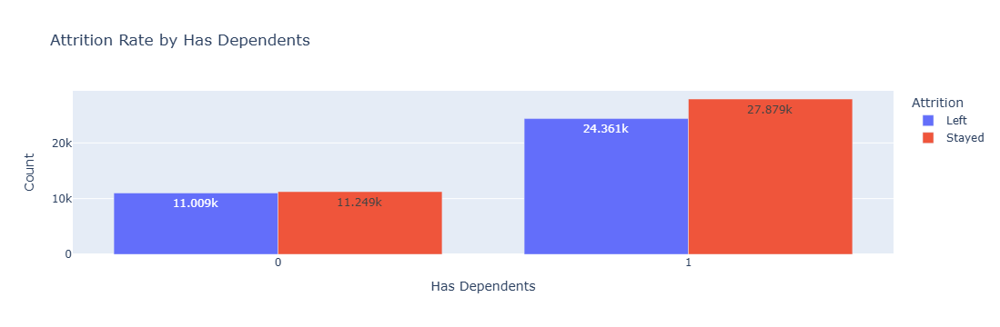

In [130]:
# Count the number of employees per Job Role and Attrition category
df_counts = extended_df.groupby(["Has Dependents", "Attrition"], observed=False).size().reset_index(name="Count")

# Create an interactive bar plot
fig = px.bar(df_counts, 
             x="Has Dependents", 
             y="Count", 
             color="Attrition", 
             title="Attrition Rate by Has Dependents",
             barmode="group",
             text_auto=True)
fig.show()

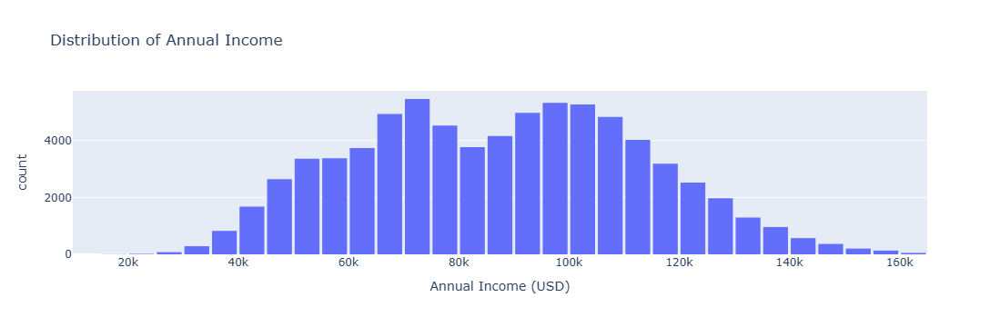

In [132]:
fig = px.histogram(extended_df, x="Annual Income", nbins=50, 
                   title="Distribution of Annual Income", 
                   labels={"Annual Income": "Annual Income (USD)"},
                   color_discrete_sequence=["#636EFA"])
fig.update_layout(bargap=0.1)
fig.show()


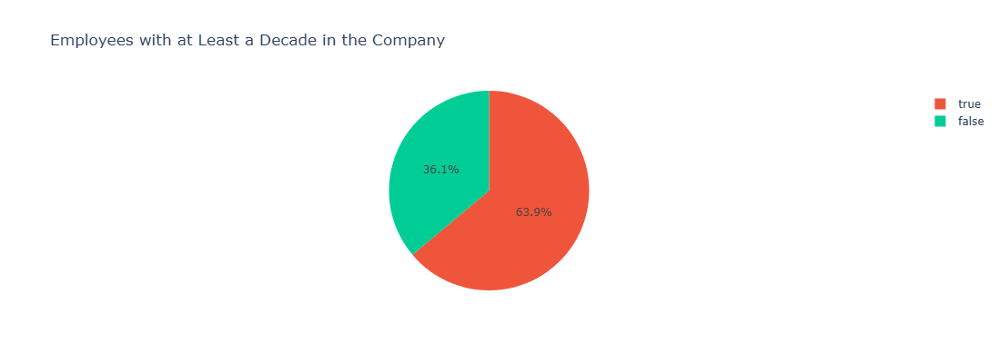

In [150]:
fig = px.pie(extended_df, names="At Least Decade", 
             title="Employees with at Least a Decade in the Company",
             color_discrete_sequence=["#EF553B", "#00CC96"])

fig.update_layout(height=400)
fig.show()

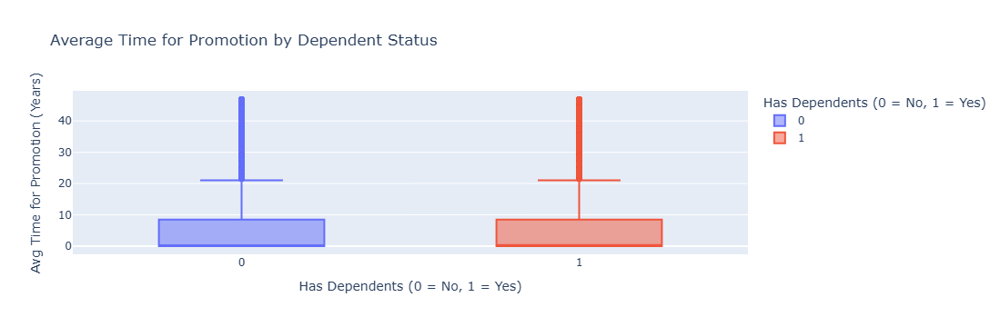

In [136]:
fig = px.box(extended_df, x="Has Dependents", y="avg time for promotion", 
             title="Average Time for Promotion by Dependent Status",
             labels={"Has Dependents": "Has Dependents (0 = No, 1 = Yes)", 
                     "avg time for promotion": "Avg Time for Promotion (Years)"},
             color="Has Dependents", color_discrete_sequence=["#636EFA", "#EF553B"])
fig.show()

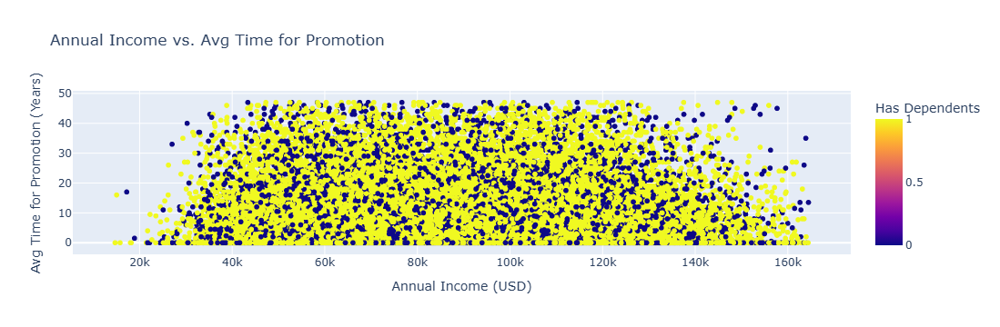

In [138]:
fig = px.scatter(extended_df, x="Annual Income", y="avg time for promotion", 
                 title="Annual Income vs. Avg Time for Promotion",
                 labels={"Annual Income": "Annual Income (USD)", 
                         "avg time for promotion": "Avg Time for Promotion (Years)"},
                 color="Has Dependents", color_discrete_sequence=["#636EFA", "#EF553B"])
fig.show()

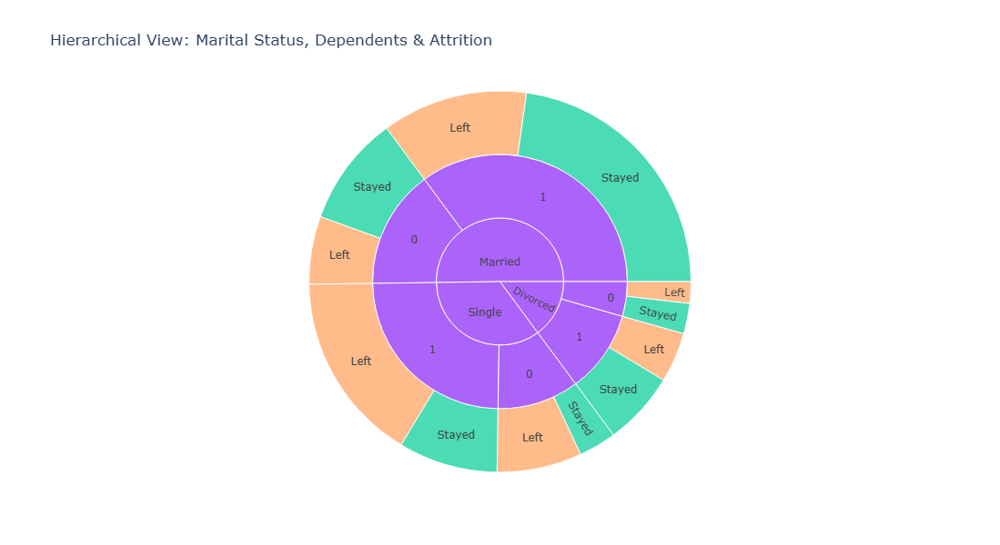

In [154]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

fig = px.sunburst(extended_df, path=["Marital Status", "Has Dependents", "Attrition"], 
                  title="Hierarchical View: Marital Status, Dependents & Attrition",
                  color="Attrition", color_discrete_map={"Yes": "#EF553B", "No": "#00CC96"})

# Increase figure size
fig.update_layout(height=600)

fig.show()

According to  this pie chart we can conclude that if you are married or devorced and you have children, you probbalby take less risks in the dayliy worklife and you stay at the company after all.

People that single, takeing more risks and if thay are not feel comftable or unplesent, they may leave.

### Save the extended Dataframe as Pickle

In [42]:
folder = "data"
file_name = "extended_employee_data"

save_file_as_pickle(extended_df, folder, file_name)

File saved as: ../data/extended_employee_data_20250319.pkl
